In [111]:
import cv2
import numpy as np
import os
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pickle
import warnings
warnings.filterwarnings('ignore')

In [112]:
class ORBDescriptor:
    def __init__(self, n_features=500):
        self.detector = cv2.ORB_create(nfeatures=n_features)
        self.name = "ORB"
    
    def compute(self, image):
        kp, des = self.detector.detectAndCompute(image, None)
        if des is None:
            des = np.zeros((1, 256), dtype=np.uint8)
        return kp, des

class AKAZEDescriptor:
    def __init__(self):
        self.detector = cv2.AKAZE_create()
        self.name = "AKAZE"
    
    def compute(self, image):
        kp, des = self.detector.detectAndCompute(image, None)
        if des is None:
            des = np.zeros((1, 61), dtype=np.uint8)
        return kp, des

class SIFTDescriptor:
    def __init__(self):
        self.detector = cv2.SIFT_create()
        self.name = "SIFT"
    
    def compute(self, image):
        kp, des = self.detector.detectAndCompute(image, None)
        if des is None:
            des = np.zeros((1, 128), dtype=np.float32)
        return kp, des

In [ ]:
class MultiDescriptorFeatureExtractor:
	def __init__(self, image_size=(256, 256)):
		self.descriptors = [
			ORBDescriptor(),
			AKAZEDescriptor(),
			SIFTDescriptor()
		]
		self.image_size = image_size
		self.vocab_sizes = {'ORB': 100, 'AKAZE': 100, 'SIFT': 100}

	def preprocess_image(self, image_path):
		img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
		if img is None:
			return None
		img = cv2.resize(img, self.image_size)
		img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
		return img

	def extract_features(self, image):
		features_dict = {}
		
		for descriptor in self.descriptors:
			kp, des = descriptor.compute(image)
			
			if des is not None and len(des) > 0:
				if descriptor.name == "SIFT":
					des = des.astype(np.float32)
					hist = np.histogram(des.flatten(), bins=50, range=(0, 256))[0]
				else:
					hist = np.histogram(des.flatten(), bins=50, range=(0, 256))[0]
				
				stats = np.array([
					len(kp),
					np.mean(des.flatten()) if des.size > 0 else 0,
					np.std(des.flatten()) if des.size > 0 else 0,
					np.min(des.flatten()) if des.size > 0 else 0,
					np.max(des.flatten()) if des.size > 0 else 0,
				])
                
				features_dict[descriptor.name] = np.concatenate([hist, stats])
			else:
				default_size = 50 + 5
				features_dict[descriptor.name] = np.zeros(default_size)
		
		return features_dict

	def get_combined_features(self, image):
		features = self.extract_features(image)
		combined = np.concatenate([
			features['ORB'],
			features['AKAZE'],
			features['SIFT']
		])
		return combined

	def get_sift_features(self, image):
		features = self.extract_features(image)
		return features['SIFT']
	
	def get_akaze_features(self, image):
		features = self.extract_features(image)
		return features['AKAZE']
	
	def get_orb_features(self, image):
		features = self.extract_features(image)
		return features['ORB']

In [ ]:
class ClothTypeClassifier:
    def __init__(self, classifier_type='rf'):
        self.feature_extractor = MultiDescriptorFeatureExtractor()
        self.scaler = StandardScaler()
        self.classifier_type = classifier_type
        
        if classifier_type == 'rf':
            self.model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
        elif classifier_type == 'svm':
            self.model = SVC(kernel='rbf', C=100, gamma='scale', probability=True)
        else:
            raise ValueError("Unsupported classifier")

        self.label_mapping = {}
        self.reverse_mapping = {}
        self.is_trained = False
        self.metrics = {}
    
    def train(self, image_paths, labels, test_size=0.2, random_state=42):
        X = []
        y = []
        
        unique_labels = list(set(labels))
        self.label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
        self.reverse_mapping = {idx: label for label, idx in self.label_mapping.items()}
        
        for img_path, label in zip(image_paths, labels):
            try:
                img = self.feature_extractor.preprocess_image(img_path)
                if img is not None:
                    features = self.feature_extractor.get_combined_features(img)
                    X.append(features)
                    y.append(self.label_mapping[label])
            except Exception:
                pass
        
        if len(X) == 0:
            raise ValueError("No images were successfully processed!")
        
        X = np.array(X)
        y = np.array(y)
        
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=random_state, stratify=y
        )
        
        X_train_scaled = self.scaler.fit_transform(X_train)
        X_test_scaled = self.scaler.transform(X_test)
        
        self.model.fit(X_train_scaled, y_train)
        self.is_trained = True
        
        self._evaluate(X_test_scaled, y_test, "Test Set")
        self._evaluate(X_train_scaled, y_train, "Training Set")
        
        return self.metrics
    
    def _evaluate(self, X, y, set_name="Test Set"):
        y_pred = self.model.predict(X)
        
        accuracy = accuracy_score(y, y_pred)
        precision = precision_score(y, y_pred, average='weighted', zero_division=0)
        recall = recall_score(y, y_pred, average='weighted', zero_division=0)
        f1 = f1_score(y, y_pred, average='weighted', zero_division=0)
        
        print(f"\n{set_name} Metrics:")
        print(f"  Accuracy:  {accuracy:.4f} ({accuracy*100:.2f}%)")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall:    {recall:.4f}")
        print(f"  F1 Score:  {f1:.4f}")
        
        if set_name not in self.metrics:
            self.metrics[set_name] = {}
        self.metrics[set_name] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1
        }
        
        print(f"\nPer-Class Metrics ({set_name}):")
        print(classification_report(y, y_pred, target_names=[self.reverse_mapping[i] for i in range(len(self.label_mapping))]))
    
    def predict(self, image_path):
        if not self.is_trained:
            raise ValueError("Model must be trained first!")
        
        img = self.feature_extractor.preprocess_image(image_path)
        if img is None:
            return None, None
        
        features = self.feature_extractor.get_combined_features(img)
        features_scaled = self.scaler.transform([features])
        
        prediction = self.model.predict(features_scaled)[0]
        
        try:
            confidence = np.max(self.model.predict_proba(features_scaled))
        except AttributeError:
            confidence = 0.5
        
        label = self.reverse_mapping[prediction]
        return label, float(confidence)
    
    def predict_batch(self, image_paths):
        results = []
        for img_path in image_paths:
            label, confidence = self.predict(img_path)
            results.append({
                'image': os.path.basename(img_path),
                'label': label,
                'confidence': confidence
            })
        return results
    
    def save_model(self, save_path):
        model_data = {
            'model': self.model,
            'scaler': self.scaler,
            'label_mapping': self.label_mapping,
            'reverse_mapping': self.reverse_mapping,
            'classifier_type': self.classifier_type,
            'image_size': self.feature_extractor.image_size,
            'metrics': self.metrics
        }
        with open(save_path, 'wb') as f:
            pickle.dump(model_data, f)
        print(f"Model saved to {save_path}")
    
    @staticmethod
    def load_model(load_path):
        with open(load_path, 'rb') as f:
            model_data = pickle.load(f)
        
        classifier = ClothTypeClassifier(classifier_type=model_data['classifier_type'])
        classifier.model = model_data['model']
        classifier.scaler = model_data['scaler']
        classifier.label_mapping = model_data['label_mapping']
        classifier.reverse_mapping = model_data['reverse_mapping']
        classifier.feature_extractor = MultiDescriptorFeatureExtractor(
            image_size=model_data.get('image_size', (256, 256))
        )
        classifier.metrics = model_data.get('metrics', {})
        classifier.is_trained = True
        return classifier

## Example Usage

This example demonstrates how to use the cloth classifier. You'll need to:
1. Prepare training data with cloth images organized by type
2. Train the classifier
3. Make predictions on new images

In [115]:
def create_sample_training_data():
	training_dir = ".\\training_data"

	if os.path.exists(training_dir):
		image_paths = []
		labels = []
		
		for cloth_type in os.listdir(training_dir):
			cloth_path = os.path.join(training_dir, cloth_type)
			if os.path.isdir(cloth_path):
				for image_file in os.listdir(cloth_path):
					if image_file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
						image_paths.append(os.path.join(cloth_path, image_file))
						labels.append(cloth_type)
		
		return image_paths, labels
	else:
		print(f"Directory '{training_dir}' not found!")
		print("Please create the directory structure as shown above.")
		return [], []

image_paths, labels = create_sample_training_data()

In [116]:
if len(image_paths) > 0:
    classifier_rf = ClothTypeClassifier(classifier_type='rf')
    rf_metrics = classifier_rf.train(image_paths, labels, test_size=0.2, random_state=42)
    classifier_rf.save_model('cloth_classifier_rf.pkl')
    
    classifier_svm = ClothTypeClassifier(classifier_type='svm')
    svm_metrics = classifier_svm.train(image_paths, labels, test_size=0.2, random_state=42)
    classifier_svm.save_model('cloth_classifier_svm.pkl')


Test Set Metrics:
  Accuracy:  0.7857 (78.57%)
  Precision: 0.7798
  Recall:    0.7857
  F1 Score:  0.7771

Per-Class Metrics (Test Set):
              precision    recall  f1-score   support

      Cotton       0.75      0.75      0.75         4
        Knit       0.83      1.00      0.91         5
       Denim       0.75      0.60      0.67         5

    accuracy                           0.79        14
   macro avg       0.78      0.78      0.78        14
weighted avg       0.78      0.79      0.78        14


Training Set Metrics:
  Accuracy:  1.0000 (100.00%)
  Precision: 1.0000
  Recall:    1.0000
  F1 Score:  1.0000

Per-Class Metrics (Training Set):
              precision    recall  f1-score   support

      Cotton       1.00      1.00      1.00        19
        Knit       1.00      1.00      1.00        18
       Denim       1.00      1.00      1.00        18

    accuracy                           1.00        55
   macro avg       1.00      1.00      1.00        55
weight

## Batch Prediction and Model Management

In [117]:
def batch_predict(image_dir, classifier):
    predictions = []
    
    if os.path.isdir(image_dir):
        for image_file in os.listdir(image_dir):
            if image_file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                image_path = os.path.join(image_dir, image_file)
                label, confidence = classifier.predict(image_path)
                predictions.append({
                    'image': image_file,
                    'label': label,
                    'confidence': confidence
                })
    
    return predictions

In [118]:
def load_and_predict(model_path, image_path):
    try:
        classifier = ClothTypeClassifier.load_model(model_path)
        label, confidence = classifier.predict(image_path)
        return classifier, label, confidence
    except FileNotFoundError:
        return None, None, None
    
def get_testing_data():
	testing_dir = ".\\testing_data"

	if os.path.exists(testing_dir):
		image_paths = []
		labels = []
		
		for image_file in os.listdir(testing_dir):
			if image_file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
				image_paths.append(os.path.join(testing_dir, image_file))
				labels.append(image_file)
		
		return image_paths, labels
	else:
		print(f"Directory '{testing_dir}' not found!")
		print("Please create the directory structure as shown above.")
		return [], []

test_images = get_testing_data()[0]

if 'classifier_rf' in locals() and 'classifier_svm' in locals():
    print("Random forest Predictions:")
    for test_img in test_images:
        if os.path.exists(test_img):
            label, confidence = classifier_rf.predict(test_img)
            if label:
                print(f"  {os.path.basename(test_img):20} -> {label:15} ({confidence:.2%})")
    
    print("\nSVM Predictions:")
    for test_img in test_images:
        if os.path.exists(test_img):
            label, confidence = classifier_svm.predict(test_img)
            if label:
                print(f"  {os.path.basename(test_img):20} -> {label:15} ({confidence:.2%})")
else:
    print("Classifiers not trained yet. Please run the training cell first.")

Random forest Predictions:
  cotton_1.jpg         -> Knit            (78.00%)
  cotton_1.jpg         -> Knit            (78.00%)
  cotton_2.jpg         -> Cotton          (82.00%)
  cotton_2.jpg         -> Cotton          (82.00%)
  denim_1.jpeg         -> Denim           (95.00%)
  denim_1.jpeg         -> Denim           (95.00%)
  denim_2.jpg          -> Denim           (77.00%)
  denim_2.jpg          -> Denim           (77.00%)
  knit_1.jpeg          -> Knit            (90.00%)
  knit_1.jpeg          -> Knit            (90.00%)
  knit_2.jpeg          -> Knit            (81.00%)

SVM Predictions:
  cotton_1.jpg         -> Knit            (46.13%)
  knit_2.jpeg          -> Knit            (81.00%)

SVM Predictions:
  cotton_1.jpg         -> Knit            (46.13%)
  cotton_2.jpg         -> Denim           (60.08%)
  denim_1.jpeg         -> Denim           (76.11%)
  denim_2.jpg          -> Denim           (75.89%)
  knit_1.jpeg          -> Knit            (63.05%)
  cotton_2.jpg     

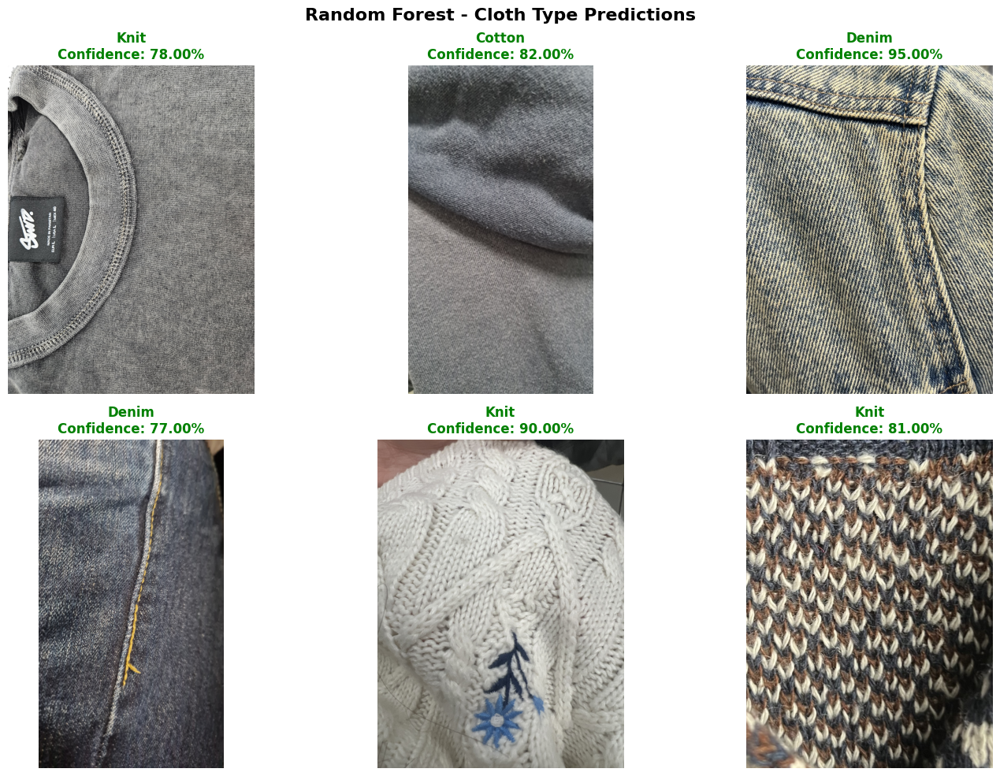

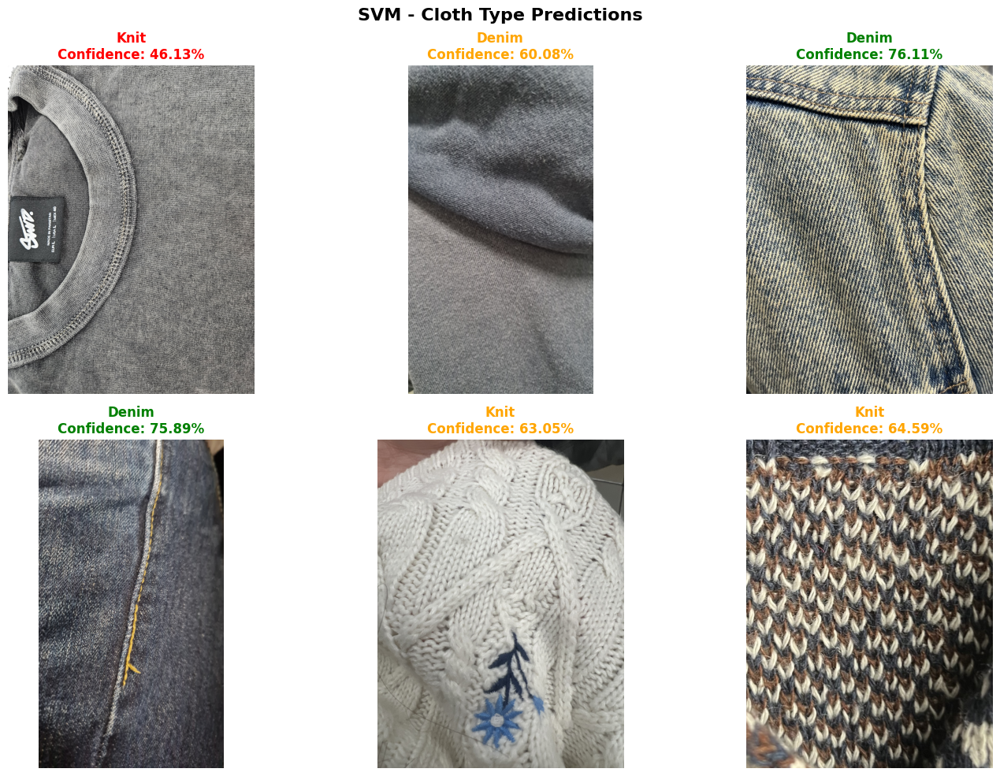

In [119]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_predictions(image_paths, classifier, title="Predictions"):
    """Visualize images with their predicted labels and confidence"""
    n_images = len(image_paths)
    cols = 3
    rows = (n_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    if n_images == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()
    
    for idx, img_path in enumerate(image_paths):
        ax = axes[idx]
        
        if not os.path.exists(img_path):
            ax.text(0.5, 0.5, f"File not found:\n{os.path.basename(img_path)}", 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.axis('off')
            continue
        
        # Load and display image
        img = cv2.imread(img_path)
        if img is None:
            ax.text(0.5, 0.5, f"Could not load:\n{os.path.basename(img_path)}", 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.axis('off')
            continue
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        
        # Get prediction
        label, confidence = classifier.predict(img_path)
        
        # Display prediction info
        if label:
            color = 'green' if confidence > 0.7 else 'orange' if confidence > 0.5 else 'red'
            ax.set_title(f"{label}\nConfidence: {confidence:.2%}", 
                        fontsize=12, fontweight='bold', color=color)
        else:
            ax.set_title("Prediction Failed", fontsize=12, color='red')
        
        ax.axis('off')
    
    # Hide unused subplots
    for idx in range(len(image_paths), len(axes)):
        axes[idx].axis('off')
    
    fig.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualize predictions
if 'classifier_rf' in locals():
    visualize_predictions(test_images, classifier_rf, "Random Forest - Cloth Type Predictions")
    visualize_predictions(test_images, classifier_svm, "SVM - Cloth Type Predictions")

## Feature Visualization and Analysis

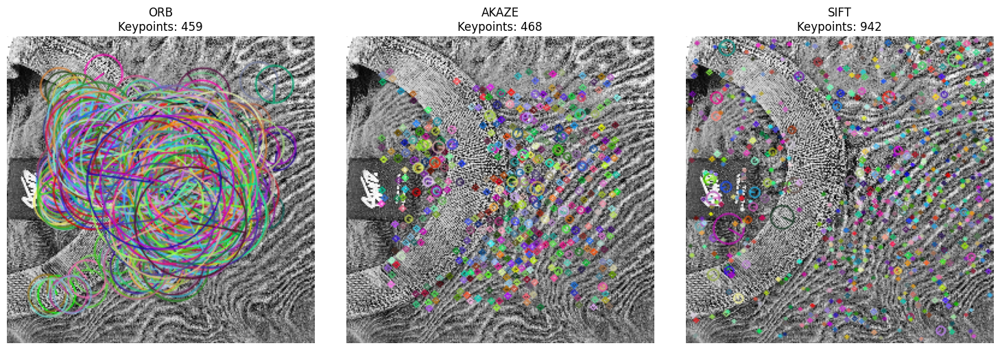

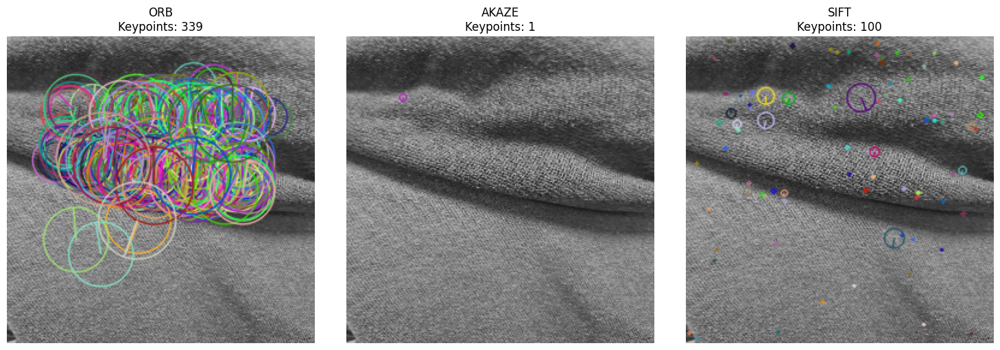

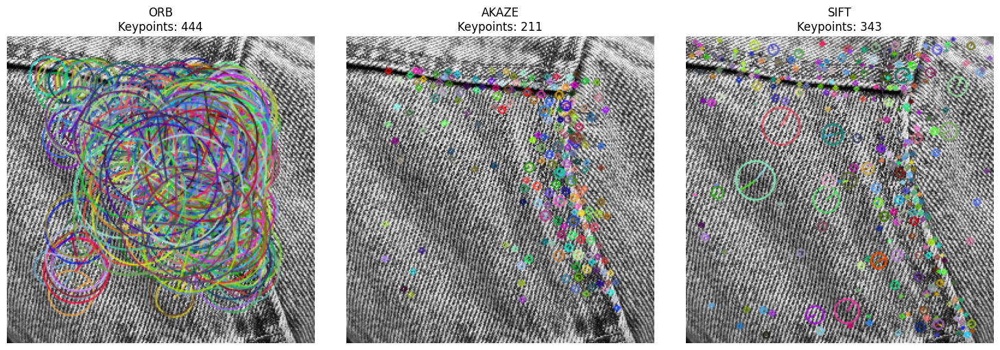

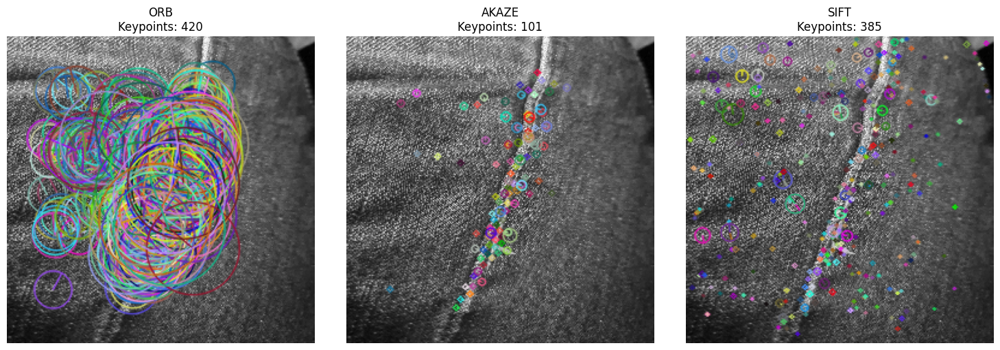

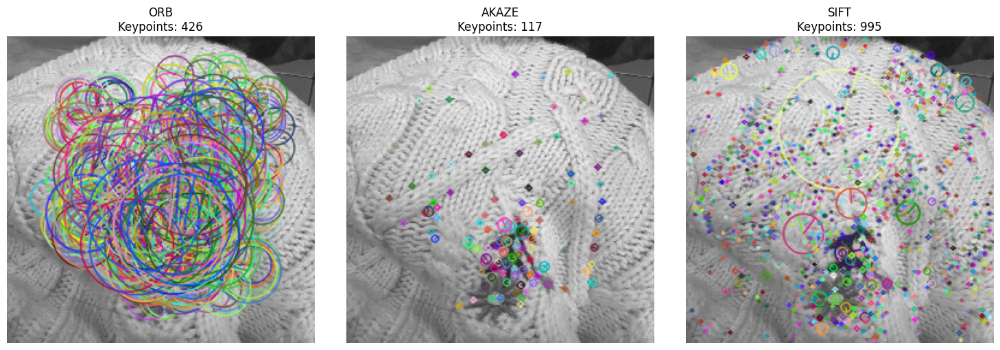

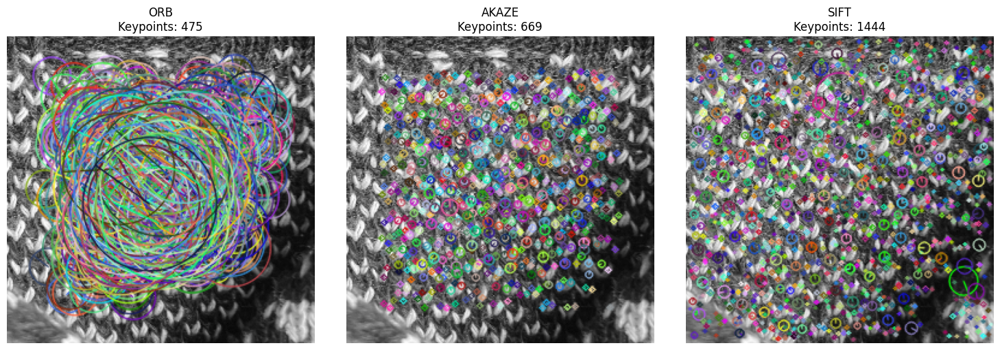

In [122]:
import matplotlib.pyplot as plt

def visualize_keypoints(image_path, descriptor_type='all'):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not load image: {image_path}")
        return
    
    img = cv2.resize(img, (256, 256))
    
    descriptors_to_show = []
    if descriptor_type == 'all':
        descriptors_to_show = [
            ORBDescriptor(),
            AKAZEDescriptor(),
            SIFTDescriptor()
        ]
    else:
        if descriptor_type == 'ORB':
            descriptors_to_show = [ORBDescriptor()]
        elif descriptor_type == 'AKAZE':
            descriptors_to_show = [AKAZEDescriptor()]
        elif descriptor_type == 'SIFT':
            descriptors_to_show = [SIFTDescriptor()]
    
    fig, axes = plt.subplots(1, len(descriptors_to_show), figsize=(15, 5))
    if len(descriptors_to_show) == 1:
        axes = [axes]
    
    for ax, descriptor in zip(axes, descriptors_to_show):
        kp, des = descriptor.compute(img)
        
        # Draw keypoints
        img_kp = cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        img_kp = cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB)
        
        ax.imshow(img_kp)
        ax.set_title(f"{descriptor.name}\nKeypoints: {len(kp)}")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

for test_image in test_images:
	visualize_keypoints(test_image, descriptor_type='all')